In [1]:
import numpy as np
import scipy
import time

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
################## Market parameters #################
T = 1
sigma = 0.2
nu = sigma**2/2
######################################################

############### Simulations parameters ###############
N_h = 201
N_T = 100
dt = T/N_T
h = 1/(N_h - 1)
time_grid = np.arange(0, T+dt, dt)
space_grid = np.arange(0, 1+h, h)
newton_stopping_criteria = 1e-11 # do not change
picard_stopping_criteria = 1e-3 # 1e-1 is a bit too high. 1e-6 would be ideal, but computations are slow.
theta = 0.01  # if it does not converge, set to 0.01 or less. To make computations faster, set to 0.5
beta = 2 # test 2, 1.1, 4
g_kind = 'default' # 'default' or 'complex'
phi_kind = 'default' # 'default' or 'complex'
f0_tilde_kind = 'thin' # 'large' or 'thin'
######################################################

##################### Functions ######################
def g(x, kind=g_kind):
    if kind == 'default':
        return - np.exp(-40 * (x - 0.5)**2)
    elif kind == 'complex':
        return - np.exp(-40 * (x - 1/3)**2) - np.exp(-40 * (x - 2/3)**2)

def H0(x, p1, p2):
    return 1/beta * ((np.minimum(0, p1))**2 + (np.maximum(0, p2))**2)**(beta/2) - g(x)

def f0_tilde(m, kind=f0_tilde_kind):
    if kind == 'thin':
        return m/10
    elif kind == 'large':
        return m*10

def phi(x, kind=phi_kind):
    if kind == 'default':
        return - np.exp(-40 * (x - 0.7)**2)
    elif kind == 'complex':
        return - np.exp(-40 * (x - 0.3)**2) - np.exp(-40 * (x - 0.9)**2)

def m0(x):
    return np.exp(-3000 * (x - 0.2)**2)

def m0_hat(x):
    return m0(x)
######################################################

In [3]:
############### Differential operators ###############
# (DW_i)_{0 \leq i < N_h}
Dx = np.diag([-1]*N_h) + np.diag([1]*(N_h-1), k=1)
Dx[N_h-1, N_h-1] = 0
Dx = Dx/h

# (DW_{i-1})_{0 \leq i < N_h}
Dx_shift = np.diag([1]*N_h) + np.diag([-1]*(N_h-1), k=-1)
Dx_shift[0, 0] = 0
Dx_shift = Dx_shift/h

# Laplacian, 0 \leq i < N_h
Dx2 = np.diag([-2]*N_h) + np.diag([1]*(N_h-1), k=1) + np.diag([1]*(N_h-1), k=-1)
Dx2[0, 0], Dx2[N_h-1, N_h-1] = -1, -1
Dx2 = Dx2/h**2
######################################################

In [4]:
############## Computing useful matrices #############
def compute_F(U_next, U_now, M):
    F = - (U_next - U_now)/dt - nu*Dx2@U_now
    F += 1/beta * (np.minimum(Dx@U_now, 0)**2 + (np.maximum(Dx_shift@U_now, 0))**2)**(beta/2)
    F += - g(space_grid) - f0_tilde(M)
    
    return F

def compute_JH(U):
    backward_spatial_diff = np.maximum(Dx_shift@U, 0) # max(U^n_i - U^n_(i-1), 0)
    forward_spatial_diff = - np.minimum(Dx@U, 0) # - min(U^n_(i+1) - U^n, 0)
    coef = backward_spatial_diff**2 + forward_spatial_diff**2
    coef = np.power(coef, beta/2-1, out=np.zeros_like(coef), where=(coef!=0))

    main_diag = (1/h * (forward_spatial_diff + backward_spatial_diff) * coef)
    sub_diag = (- 1/h* backward_spatial_diff * coef)[1:]
    sup_diag = (- 1/h * forward_spatial_diff * coef)[:-1]
    JH = np.diag(sub_diag, k=-1) + np.diag(main_diag) + np.diag(sup_diag, k=+1)

    return JH

def compute_J_banded(U):
    backward_spatial_diff = np.maximum(Dx_shift@U, 0) # max(U^n_i - U^n_(i-1), 0)
    forward_spatial_diff = - np.minimum(Dx@U, 0) # - min(U^n_(i+1) - U^n, 0)
    coef = backward_spatial_diff**2 + forward_spatial_diff**2
    coef = np.power(coef, beta/2-1, out=np.zeros_like(coef), where=(coef!=0))
    
    sub_diag = (- 1/h* backward_spatial_diff * coef)[1:]
    main_diag = (1/h * (forward_spatial_diff + backward_spatial_diff) * coef)
    sup_diag = (- 1/h * forward_spatial_diff * coef)[:-1]
    
    banded_matrix = np.zeros((3, U.size))
    banded_matrix[0, 1:] = sup_diag - nu/h**2
    banded_matrix[1] = main_diag + 1/dt + 2*nu/h**2
    banded_matrix[2, :-1] = sub_diag - nu/h**2
    return banded_matrix
######################################################

In [5]:
############## Solving HJB equation ##################
def Newton_Raphson(U, M):
    # Initialization
    U_k = U.copy()

    k = 0
    normF = np.inf
    while normF > newton_stopping_criteria:
        F = compute_F(U, U_k, M)
        J = compute_J_banded(U_k)
        U_k = U_k - scipy.linalg.solve_banded((1, 1), J, F)
        normF = np.linalg.norm(F)
        k += 1

    return U_k

def solve_HJB(M):
    # Initialization
    U_hat = np.zeros(M.shape)
    U_hat[N_T] = phi(space_grid)

    # Backward loop
    for n in range(N_T-1, -1, -1):
        U_hat[n] = Newton_Raphson(U_hat[n+1], M[n+1])

    return U_hat
######################################################

In [6]:
############## Solving KFP equation ##################
def solve_KFP(U):
    # Initialization
    M_hat = np.zeros(U.shape)
    M_hat[0] = m0_hat(space_grid)
    
    # Forward loop
    for n in range(N_T):
        JH = compute_JH(U[n])
        M_hat[n+1] = np.linalg.solve(np.identity(N_h) - nu*dt*Dx2+dt*JH.T, M_hat[n])

    return M_hat
######################################################

In [7]:
############ Solving the whole system ################
def Picard(U_old, M_old):

    t0 = time.time()
    k = 0
    norm_increment = np.inf
    while norm_increment > picard_stopping_criteria:
        print(f"[Picard] Iteration {k}, previous norm: {norm_increment}, theta: {theta}, elapsed time: {time.time() - t0}")
        U_hat = solve_HJB(M_old)
        M_hat = solve_KFP(U_hat)

        U_new = (1 - theta) * U_old + theta * U_hat
        M_new = (1 - theta) * M_old + theta * M_hat

        increment = np.hstack((U_new - U_old, M_new - M_old))
        norm_increment = np.linalg.norm(increment)
        k += 1

        U_old, M_old = U_new, M_new
           
        if k%25 == 0:
            plt.contour(space_grid, time_grid, U_new, levels=20)
            plt.title(f"Contour lines of $U$, k={k}, norm = {norm_increment}")
            plt.xlabel("$x$ axis")
            plt.ylabel("$t$ axis")
            plt.grid()
            plt.show()

            plt.contour(space_grid, time_grid, M_new, levels=50)
            plt.grid()
            plt.title(f"Contour lines of $M$, k={k}, norm = {norm_increment}")
            plt.xlabel("$x$ axis")
            plt.ylabel("$t$ axis")
            plt.show()

    return U_new, M_new
######################################################

[Picard] Iteration 0, previous norm: inf, theta: 0.01, elapsed time: 0.0
[Picard] Iteration 1, previous norm: 1.2537346260369342, theta: 0.01, elapsed time: 1.2981791496276855
[Picard] Iteration 2, previous norm: 1.2409895845444932, theta: 0.01, elapsed time: 2.597125768661499
[Picard] Iteration 3, previous norm: 1.2283743026516554, theta: 0.01, elapsed time: 3.8451993465423584
[Picard] Iteration 4, previous norm: 1.2158874568781763, theta: 0.01, elapsed time: 4.986259698867798
[Picard] Iteration 5, previous norm: 1.2035277372699569, theta: 0.01, elapsed time: 6.197780609130859
[Picard] Iteration 6, previous norm: 1.191293847251323, theta: 0.01, elapsed time: 7.504175186157227
[Picard] Iteration 7, previous norm: 1.1791845035012, theta: 0.01, elapsed time: 8.689731121063232
[Picard] Iteration 8, previous norm: 1.1671984358329899, theta: 0.01, elapsed time: 9.884202480316162
[Picard] Iteration 9, previous norm: 1.1553343870259258, theta: 0.01, elapsed time: 11.15424394607544
[Picard] It

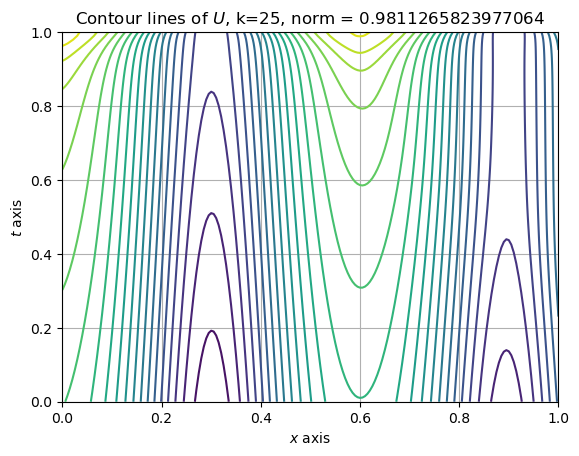

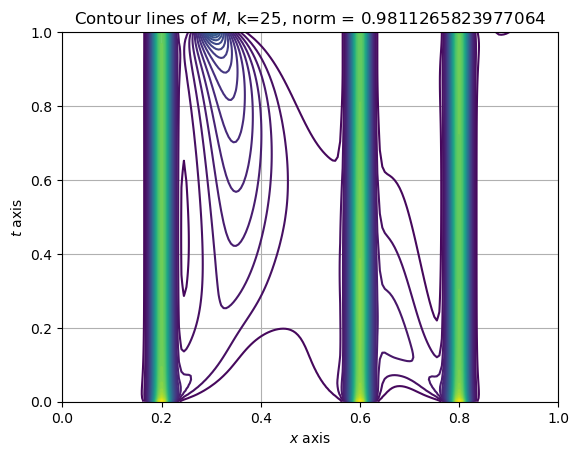

[Picard] Iteration 25, previous norm: 0.9811265823977064, theta: 0.01, elapsed time: 29.982094049453735
[Picard] Iteration 26, previous norm: 0.9711564540360382, theta: 0.01, elapsed time: 31.098857879638672
[Picard] Iteration 27, previous norm: 0.9612877890814315, theta: 0.01, elapsed time: 32.20831751823425
[Picard] Iteration 28, previous norm: 0.9515195531817252, theta: 0.01, elapsed time: 33.34829783439636
[Picard] Iteration 29, previous norm: 0.9418507225297433, theta: 0.01, elapsed time: 34.50323557853699
[Picard] Iteration 30, previous norm: 0.9322802837937281, theta: 0.01, elapsed time: 35.649959325790405
[Picard] Iteration 31, previous norm: 0.9228072340020019, theta: 0.01, elapsed time: 36.76850891113281
[Picard] Iteration 32, previous norm: 0.9134305803933944, theta: 0.01, elapsed time: 37.88841915130615
[Picard] Iteration 33, previous norm: 0.9041493403687321, theta: 0.01, elapsed time: 39.00816202163696
[Picard] Iteration 34, previous norm: 0.8949625413620081, theta: 0.01,

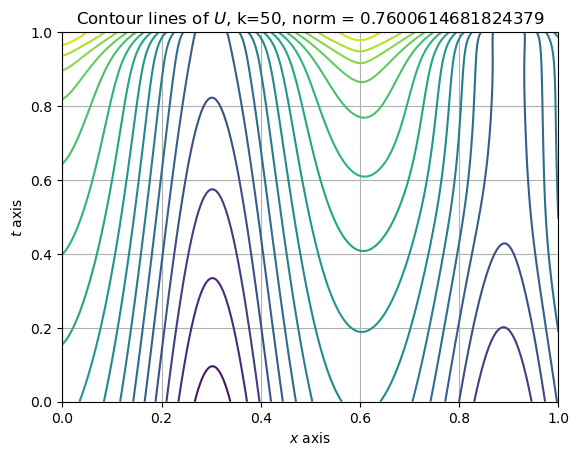

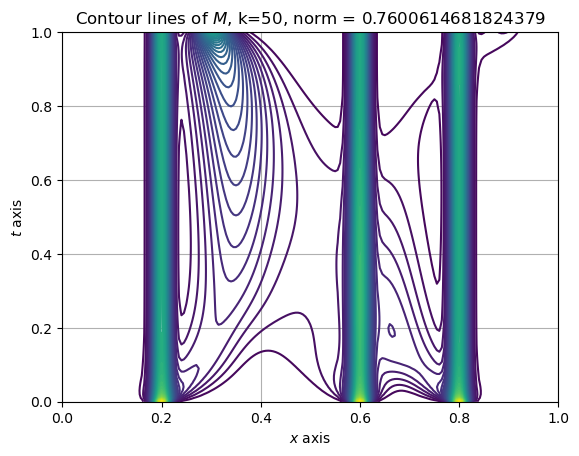

[Picard] Iteration 50, previous norm: 0.7600614681824379, theta: 0.01, elapsed time: 58.677223205566406
[Picard] Iteration 51, previous norm: 0.7523406069390065, theta: 0.01, elapsed time: 59.81362318992615
[Picard] Iteration 52, previous norm: 0.7446982845131991, theta: 0.01, elapsed time: 60.936145067214966
[Picard] Iteration 53, previous norm: 0.7371337006554447, theta: 0.01, elapsed time: 62.06805062294006
[Picard] Iteration 54, previous norm: 0.7296460633003231, theta: 0.01, elapsed time: 63.20799446105957
[Picard] Iteration 55, previous norm: 0.7222345884548491, theta: 0.01, elapsed time: 64.33584451675415
[Picard] Iteration 56, previous norm: 0.7148985001135544, theta: 0.01, elapsed time: 65.4585018157959
[Picard] Iteration 57, previous norm: 0.70763703020829, theta: 0.01, elapsed time: 66.61523580551147
[Picard] Iteration 58, previous norm: 0.7004494185109496, theta: 0.01, elapsed time: 67.74166965484619
[Picard] Iteration 59, previous norm: 0.6933349125377535, theta: 0.01, ela

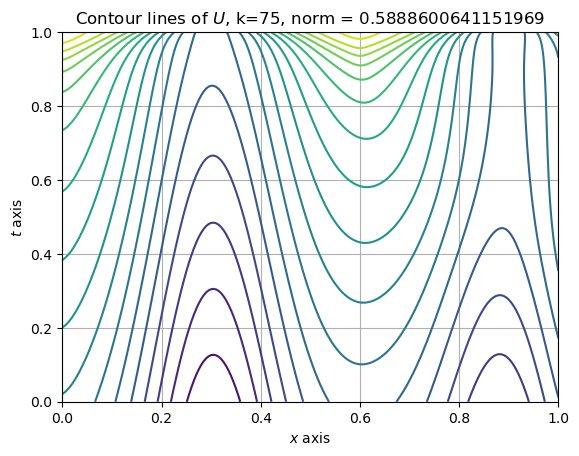

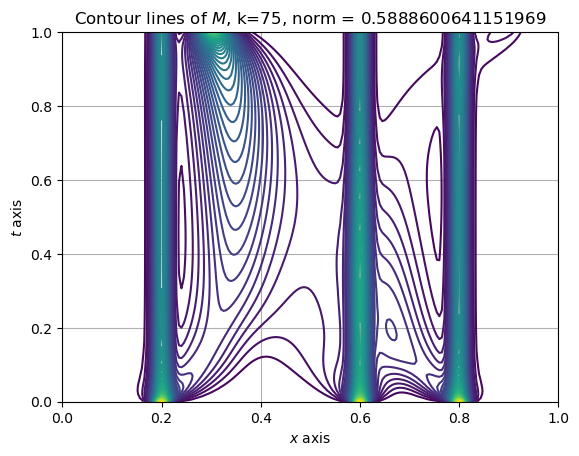

[Picard] Iteration 75, previous norm: 0.5888600641151969, theta: 0.01, elapsed time: 87.40993571281433
[Picard] Iteration 76, previous norm: 0.5828803758023536, theta: 0.01, elapsed time: 88.5968132019043
[Picard] Iteration 77, previous norm: 0.5769614891825983, theta: 0.01, elapsed time: 89.7149555683136
[Picard] Iteration 78, previous norm: 0.5711027850285213, theta: 0.01, elapsed time: 90.83243751525879
[Picard] Iteration 79, previous norm: 0.5653036504459262, theta: 0.01, elapsed time: 91.98253846168518
[Picard] Iteration 80, previous norm: 0.5595634787772049, theta: 0.01, elapsed time: 93.10612773895264
[Picard] Iteration 81, previous norm: 0.5538816695825528, theta: 0.01, elapsed time: 94.23248171806335
[Picard] Iteration 82, previous norm: 0.5482576285351561, theta: 0.01, elapsed time: 95.36739778518677
[Picard] Iteration 83, previous norm: 0.5426907673768696, theta: 0.01, elapsed time: 96.503901720047
[Picard] Iteration 84, previous norm: 0.5371805038479079, theta: 0.01, elapse

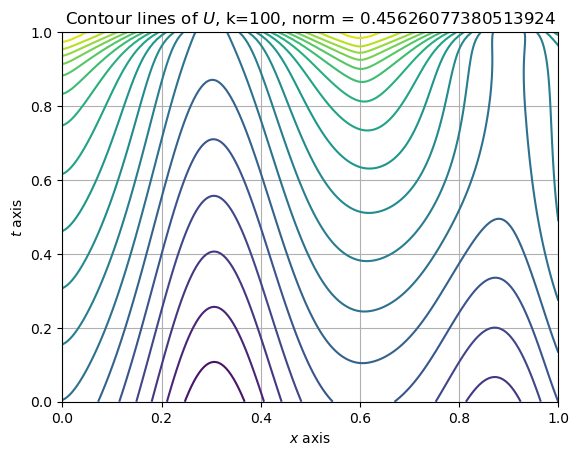

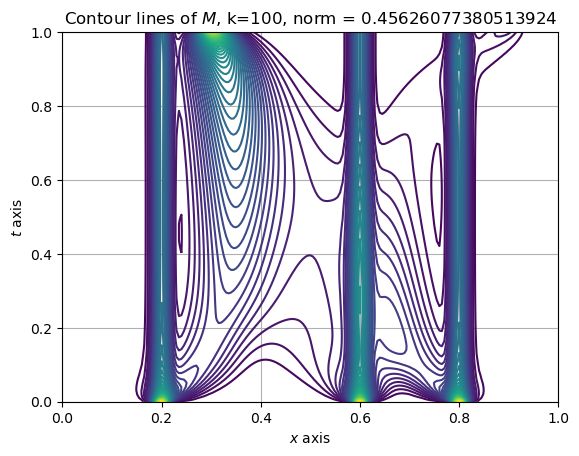

[Picard] Iteration 100, previous norm: 0.45626077380513924, theta: 0.01, elapsed time: 116.1753396987915
[Picard] Iteration 101, previous norm: 0.45162911166500513, theta: 0.01, elapsed time: 117.33082985877991
[Picard] Iteration 102, previous norm: 0.4470445257193667, theta: 0.01, elapsed time: 118.50337386131287
[Picard] Iteration 103, previous norm: 0.44250653676581064, theta: 0.01, elapsed time: 119.72886872291565
[Picard] Iteration 104, previous norm: 0.4380146704887384, theta: 0.01, elapsed time: 120.87066698074341
[Picard] Iteration 105, previous norm: 0.4335684574094222, theta: 0.01, elapsed time: 122.02418637275696
[Picard] Iteration 106, previous norm: 0.4291674328354828, theta: 0.01, elapsed time: 123.19073295593262
[Picard] Iteration 107, previous norm: 0.4248111368120772, theta: 0.01, elapsed time: 124.34561061859131
[Picard] Iteration 108, previous norm: 0.4204991140798238, theta: 0.01, elapsed time: 125.5221917629242
[Picard] Iteration 109, previous norm: 0.4162309140182

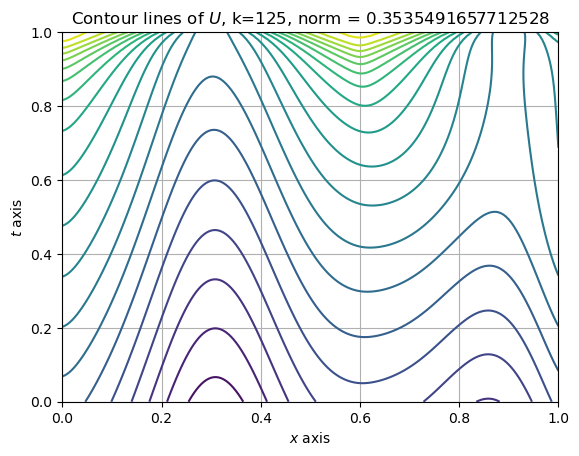

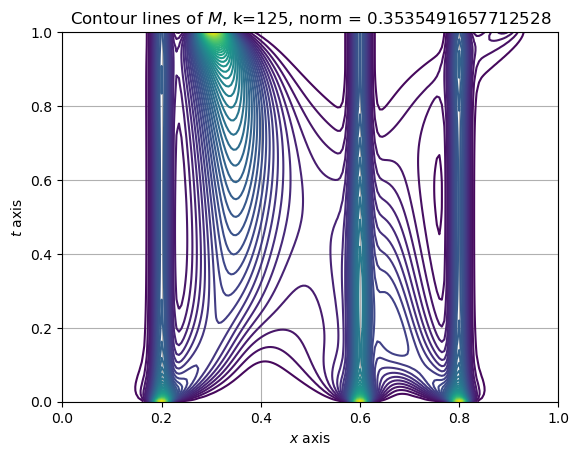

[Picard] Iteration 125, previous norm: 0.3535491657712528, theta: 0.01, elapsed time: 145.5886673927307
[Picard] Iteration 126, previous norm: 0.3499612819211842, theta: 0.01, elapsed time: 146.77160024642944
[Picard] Iteration 127, previous norm: 0.346409851586082, theta: 0.01, elapsed time: 147.89691019058228
[Picard] Iteration 128, previous norm: 0.34289450386431053, theta: 0.01, elapsed time: 149.02394819259644
[Picard] Iteration 129, previous norm: 0.33941487163229417, theta: 0.01, elapsed time: 150.15349459648132
[Picard] Iteration 130, previous norm: 0.3359705915114961, theta: 0.01, elapsed time: 151.27496075630188
[Picard] Iteration 131, previous norm: 0.33256130382710697, theta: 0.01, elapsed time: 152.42044234275818
[Picard] Iteration 132, previous norm: 0.32918665256868707, theta: 0.01, elapsed time: 153.54700803756714
[Picard] Iteration 133, previous norm: 0.32584628535403076, theta: 0.01, elapsed time: 154.68693661689758
[Picard] Iteration 134, previous norm: 0.32253985339

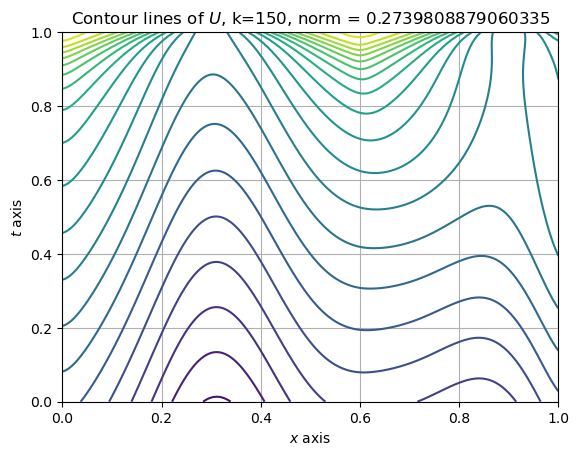

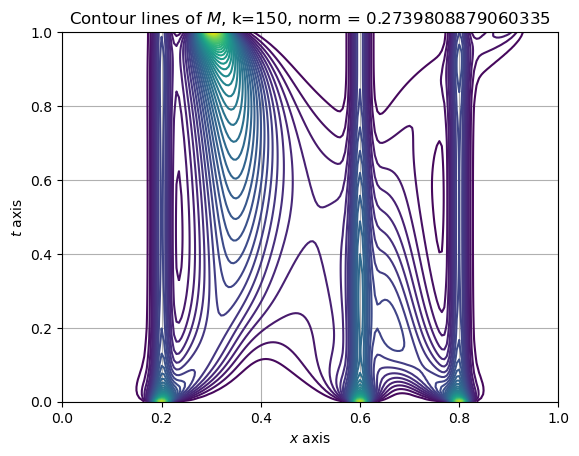

[Picard] Iteration 150, previous norm: 0.2739808879060335, theta: 0.01, elapsed time: 174.6998631954193
[Picard] Iteration 151, previous norm: 0.2712012980498278, theta: 0.01, elapsed time: 175.82186889648438
[Picard] Iteration 152, previous norm: 0.26844993925263305, theta: 0.01, elapsed time: 176.96721601486206
[Picard] Iteration 153, previous norm: 0.26572652439774447, theta: 0.01, elapsed time: 178.10695362091064
[Picard] Iteration 154, previous norm: 0.2630307692932847, theta: 0.01, elapsed time: 179.2336347103119
[Picard] Iteration 155, previous norm: 0.2603623926423492, theta: 0.01, elapsed time: 180.41334557533264
[Picard] Iteration 156, previous norm: 0.2577211160134571, theta: 0.01, elapsed time: 181.5448145866394
[Picard] Iteration 157, previous norm: 0.25510666380455194, theta: 0.01, elapsed time: 182.68482637405396
[Picard] Iteration 158, previous norm: 0.2525187632301736, theta: 0.01, elapsed time: 183.832763671875
[Picard] Iteration 159, previous norm: 0.2499571442851766

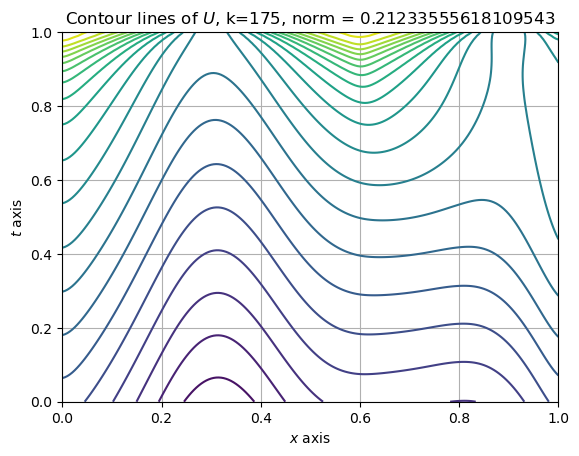

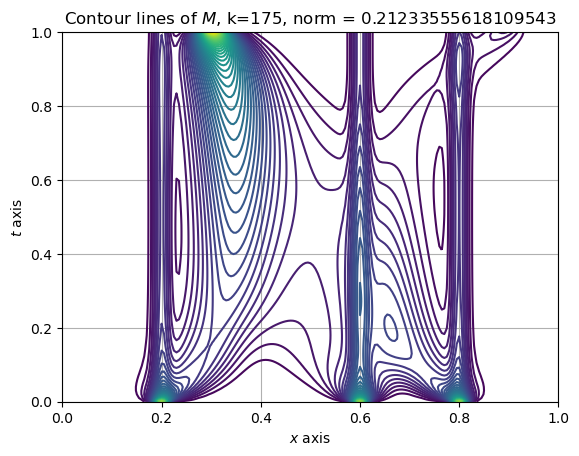

[Picard] Iteration 175, previous norm: 0.21233555618109543, theta: 0.01, elapsed time: 203.56527590751648
[Picard] Iteration 176, previous norm: 0.21018197291851898, theta: 0.01, elapsed time: 204.7134108543396
[Picard] Iteration 177, previous norm: 0.20805025528378027, theta: 0.01, elapsed time: 205.94901585578918
[Picard] Iteration 178, previous norm: 0.20594018098638298, theta: 0.01, elapsed time: 207.1197531223297
[Picard] Iteration 179, previous norm: 0.20385153000283912, theta: 0.01, elapsed time: 208.2650444507599
[Picard] Iteration 180, previous norm: 0.2017840845507075, theta: 0.01, elapsed time: 209.45956087112427
[Picard] Iteration 181, previous norm: 0.1997376290630616, theta: 0.01, elapsed time: 210.7313952445984
[Picard] Iteration 182, previous norm: 0.19771195017093537, theta: 0.01, elapsed time: 211.9485466480255
[Picard] Iteration 183, previous norm: 0.19570683667309285, theta: 0.01, elapsed time: 213.08719658851624
[Picard] Iteration 184, previous norm: 0.193722079517

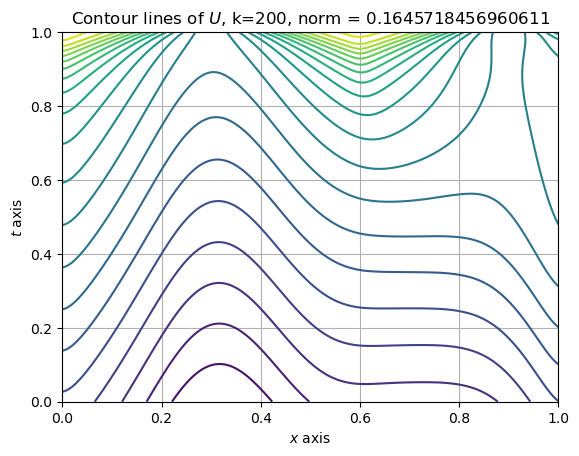

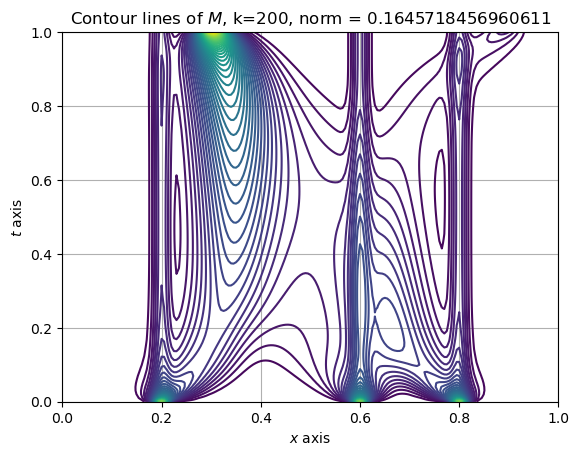

[Picard] Iteration 200, previous norm: 0.1645718456960611, theta: 0.01, elapsed time: 235.03502583503723
[Picard] Iteration 201, previous norm: 0.16290314242710047, theta: 0.01, elapsed time: 236.1477930545807
[Picard] Iteration 202, previous norm: 0.1612513763383676, theta: 0.01, elapsed time: 237.25493478775024
[Picard] Iteration 203, previous norm: 0.15961637531156422, theta: 0.01, elapsed time: 238.3753683567047
[Picard] Iteration 204, previous norm: 0.15799796898003746, theta: 0.01, elapsed time: 239.5258367061615
[Picard] Iteration 205, previous norm: 0.1563959887109215, theta: 0.01, elapsed time: 240.60866689682007
[Picard] Iteration 206, previous norm: 0.15481026758746247, theta: 0.01, elapsed time: 241.72239065170288
[Picard] Iteration 207, previous norm: 0.15324064039152246, theta: 0.01, elapsed time: 242.8355712890625
[Picard] Iteration 208, previous norm: 0.15168694358626356, theta: 0.01, elapsed time: 243.90191531181335
[Picard] Iteration 209, previous norm: 0.150149015297

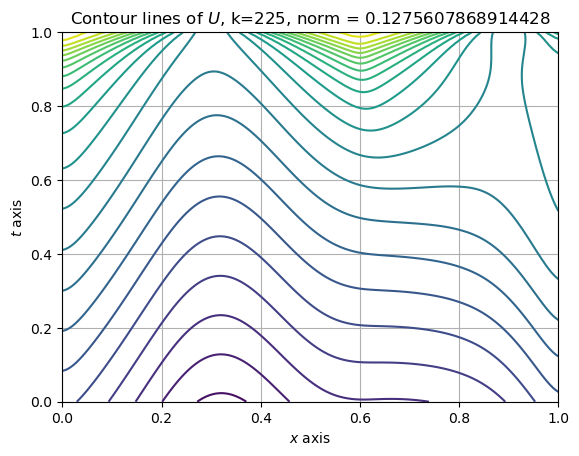

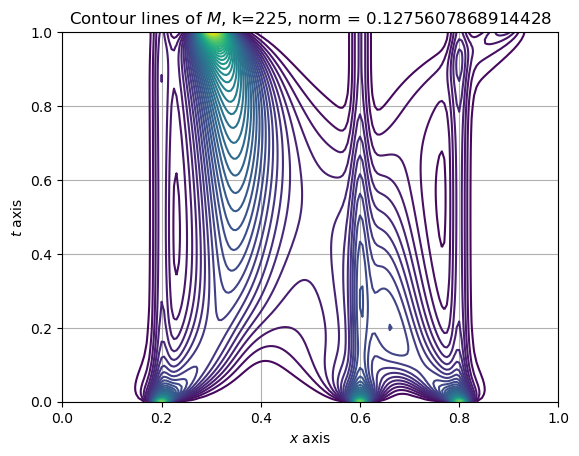

[Picard] Iteration 225, previous norm: 0.1275607868914428, theta: 0.01, elapsed time: 263.07065081596375
[Picard] Iteration 226, previous norm: 0.12626768989024284, theta: 0.01, elapsed time: 264.1535313129425
[Picard] Iteration 227, previous norm: 0.1249877137435895, theta: 0.01, elapsed time: 265.24814891815186
[Picard] Iteration 228, previous norm: 0.1237207251653044, theta: 0.01, elapsed time: 266.31807923316956
[Picard] Iteration 229, previous norm: 0.12246659222347069, theta: 0.01, elapsed time: 267.40010619163513
[Picard] Iteration 230, previous norm: 0.12122518432698472, theta: 0.01, elapsed time: 268.4666962623596
[Picard] Iteration 231, previous norm: 0.11999637221450411, theta: 0.01, elapsed time: 269.5174171924591
[Picard] Iteration 232, previous norm: 0.11878002793952454, theta: 0.01, elapsed time: 270.5998876094818
[Picard] Iteration 233, previous norm: 0.11757602485697992, theta: 0.01, elapsed time: 271.68273663520813
[Picard] Iteration 234, previous norm: 0.116384237609

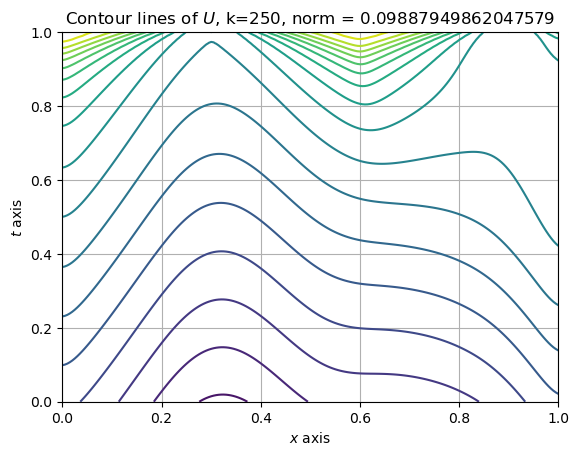

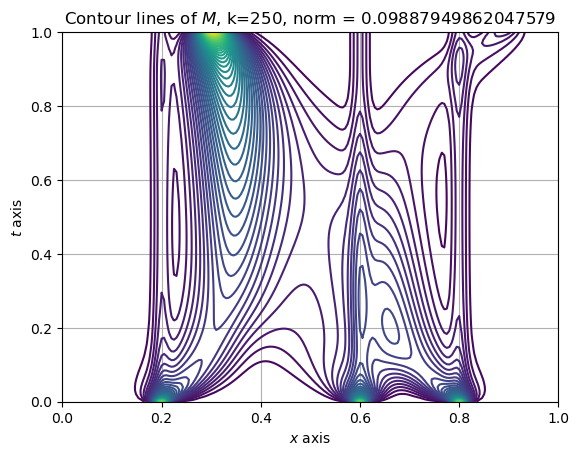

[Picard] Iteration 250, previous norm: 0.09887949862047579, theta: 0.01, elapsed time: 291.06424140930176
[Picard] Iteration 251, previous norm: 0.09787738765459664, theta: 0.01, elapsed time: 292.2667727470398
[Picard] Iteration 252, previous norm: 0.09688544204575221, theta: 0.01, elapsed time: 293.46108508110046
[Picard] Iteration 253, previous norm: 0.09590355856513356, theta: 0.01, elapsed time: 294.60661220550537
[Picard] Iteration 254, previous norm: 0.09493163503358164, theta: 0.01, elapsed time: 295.7882740497589
[Picard] Iteration 255, previous norm: 0.09396957031089767, theta: 0.01, elapsed time: 296.977343082428
[Picard] Iteration 256, previous norm: 0.093017264285263, theta: 0.01, elapsed time: 298.156592130661
[Picard] Iteration 257, previous norm: 0.09207461786315224, theta: 0.01, elapsed time: 299.20766139030457
[Picard] Iteration 258, previous norm: 0.09114153296070038, theta: 0.01, elapsed time: 300.248042345047
[Picard] Iteration 259, previous norm: 0.090217912485854

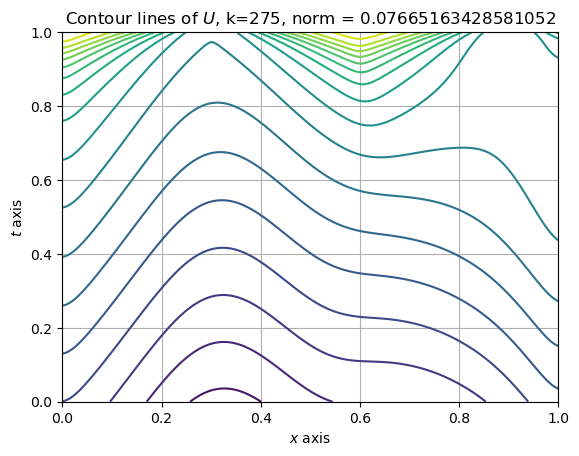

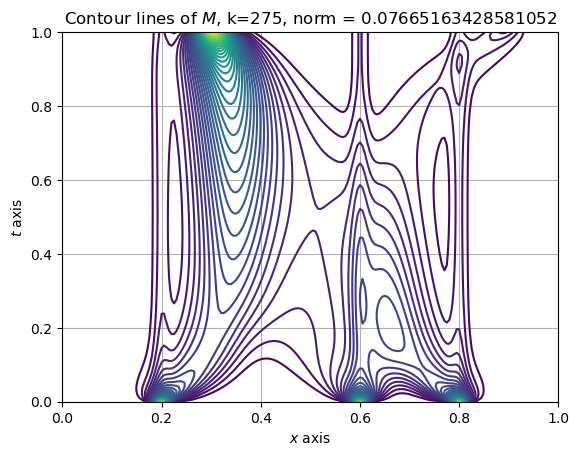

[Picard] Iteration 275, previous norm: 0.07665163428581052, theta: 0.01, elapsed time: 318.3831684589386
[Picard] Iteration 276, previous norm: 0.07587497317631625, theta: 0.01, elapsed time: 319.46018052101135
[Picard] Iteration 277, previous norm: 0.07510618833435602, theta: 0.01, elapsed time: 320.4589910507202
[Picard] Iteration 278, previous norm: 0.07434519980275647, theta: 0.01, elapsed time: 321.51258754730225
[Picard] Iteration 279, previous norm: 0.07359192843704326, theta: 0.01, elapsed time: 322.55302715301514
[Picard] Iteration 280, previous norm: 0.07284629589716844, theta: 0.01, elapsed time: 323.5957374572754
[Picard] Iteration 281, previous norm: 0.07210822463932147, theta: 0.01, elapsed time: 324.6689076423645
[Picard] Iteration 282, previous norm: 0.07137763790782467, theta: 0.01, elapsed time: 325.7363405227661
[Picard] Iteration 283, previous norm: 0.07065445972711103, theta: 0.01, elapsed time: 326.80647802352905
[Picard] Iteration 284, previous norm: 0.0699386148

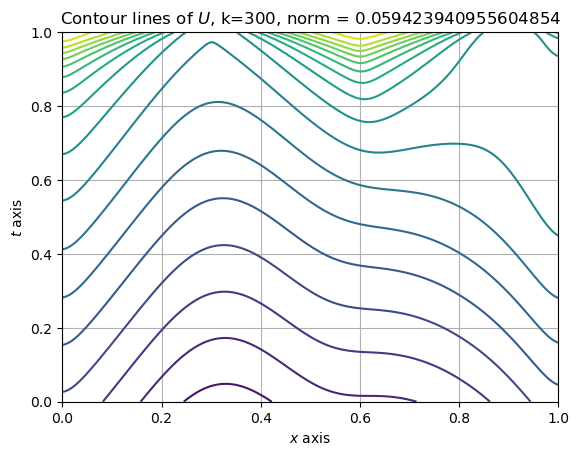

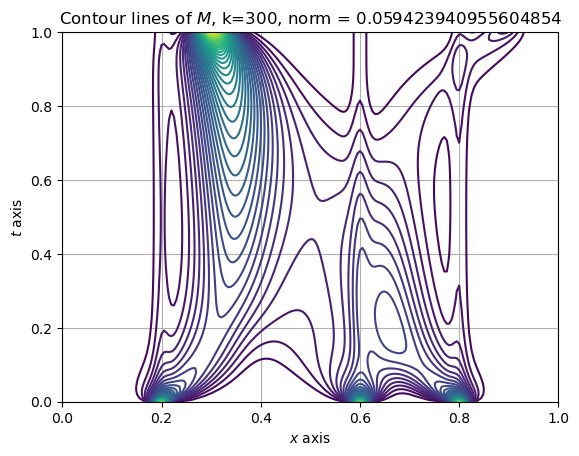

[Picard] Iteration 300, previous norm: 0.059423940955604854, theta: 0.01, elapsed time: 344.9099781513214
[Picard] Iteration 301, previous norm: 0.058821968273043604, theta: 0.01, elapsed time: 345.98038959503174
[Picard] Iteration 302, previous norm: 0.05822609873398197, theta: 0.01, elapsed time: 347.04164147377014
[Picard] Iteration 303, previous norm: 0.057636270400482026, theta: 0.01, elapsed time: 348.135445356369
[Picard] Iteration 304, previous norm: 0.05705242196392042, theta: 0.01, elapsed time: 349.1913831233978
[Picard] Iteration 305, previous norm: 0.05647449273858462, theta: 0.01, elapsed time: 350.24972653388977
[Picard] Iteration 306, previous norm: 0.055902422655335016, theta: 0.01, elapsed time: 351.31184434890747
[Picard] Iteration 307, previous norm: 0.05533615225533122, theta: 0.01, elapsed time: 352.41251015663147
[Picard] Iteration 308, previous norm: 0.05477562268382485, theta: 0.01, elapsed time: 353.50822615623474
[Picard] Iteration 309, previous norm: 0.05422

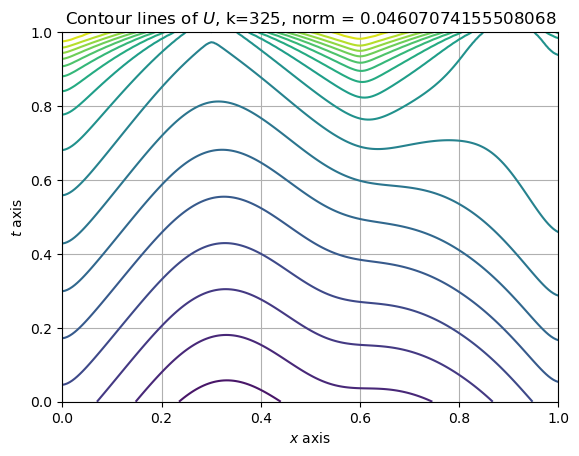

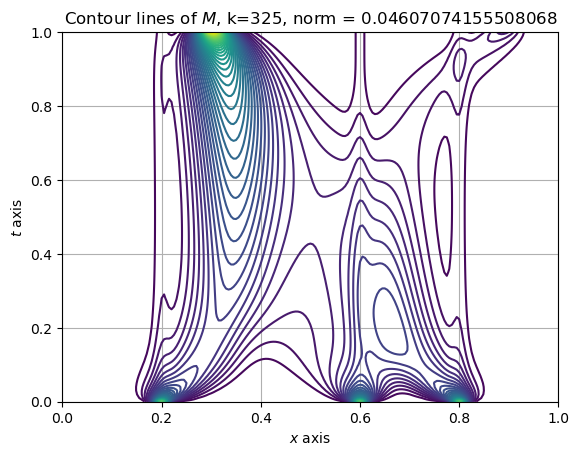

[Picard] Iteration 325, previous norm: 0.04607074155508068, theta: 0.01, elapsed time: 371.9945721626282
[Picard] Iteration 326, previous norm: 0.04560413585427767, theta: 0.01, elapsed time: 373.05320501327515
[Picard] Iteration 327, previous norm: 0.045142259706943536, theta: 0.01, elapsed time: 374.07944774627686
[Picard] Iteration 328, previous norm: 0.04468506512908475, theta: 0.01, elapsed time: 375.1222596168518
[Picard] Iteration 329, previous norm: 0.044232504624072154, theta: 0.01, elapsed time: 376.1953933238983
[Picard] Iteration 330, previous norm: 0.043784531177685874, theta: 0.01, elapsed time: 377.271808385849
[Picard] Iteration 331, previous norm: 0.04334109825320698, theta: 0.01, elapsed time: 378.3792521953583
[Picard] Iteration 332, previous norm: 0.042902159786563775, theta: 0.01, elapsed time: 379.4208769798279
[Picard] Iteration 333, previous norm: 0.042467670181523184, theta: 0.01, elapsed time: 380.4935555458069
[Picard] Iteration 334, previous norm: 0.04203758

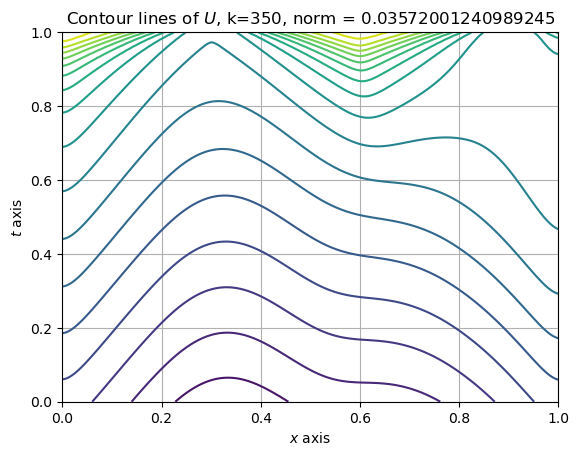

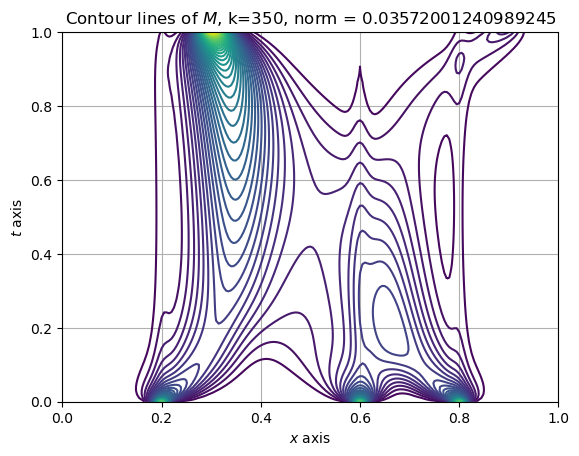

[Picard] Iteration 350, previous norm: 0.03572001240989245, theta: 0.01, elapsed time: 399.30444383621216
[Picard] Iteration 351, previous norm: 0.035358311179269526, theta: 0.01, elapsed time: 400.3735282421112
[Picard] Iteration 352, previous norm: 0.03500027532370155, theta: 0.01, elapsed time: 401.36561727523804
[Picard] Iteration 353, previous norm: 0.03464586766620485, theta: 0.01, elapsed time: 402.3974771499634
[Picard] Iteration 354, previous norm: 0.03429505140726994, theta: 0.01, elapsed time: 403.4415395259857
[Picard] Iteration 355, previous norm: 0.03394779012102478, theta: 0.01, elapsed time: 404.48990845680237
[Picard] Iteration 356, previous norm: 0.0336040477514358, theta: 0.01, elapsed time: 405.5307340621948
[Picard] Iteration 357, previous norm: 0.03326378860854839, theta: 0.01, elapsed time: 406.5417764186859
[Picard] Iteration 358, previous norm: 0.03292697736476584, theta: 0.01, elapsed time: 407.55546402931213
[Picard] Iteration 359, previous norm: 0.0325935790

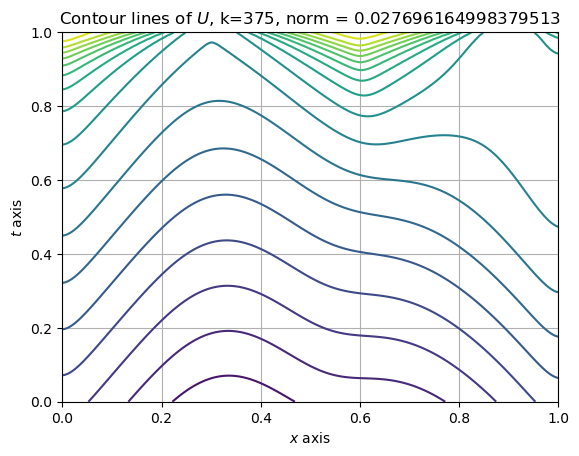

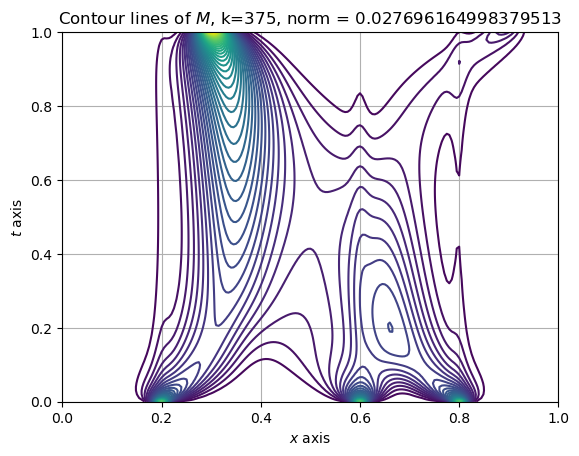

[Picard] Iteration 375, previous norm: 0.027696164998379513, theta: 0.01, elapsed time: 425.7069854736328
[Picard] Iteration 376, previous norm: 0.027415766703567972, theta: 0.01, elapsed time: 426.728600025177
[Picard] Iteration 377, previous norm: 0.02713820924915941, theta: 0.01, elapsed time: 427.73385214805603
[Picard] Iteration 378, previous norm: 0.026863463828821137, theta: 0.01, elapsed time: 428.78023529052734
[Picard] Iteration 379, previous norm: 0.026591501928612545, theta: 0.01, elapsed time: 429.8061993122101
[Picard] Iteration 380, previous norm: 0.026322295324011924, theta: 0.01, elapsed time: 430.83667969703674
[Picard] Iteration 381, previous norm: 0.026055816076978634, theta: 0.01, elapsed time: 431.92535638809204
[Picard] Iteration 382, previous norm: 0.025792036533038347, theta: 0.01, elapsed time: 432.9681324958801
[Picard] Iteration 383, previous norm: 0.02553092931840334, theta: 0.01, elapsed time: 434.0566828250885
[Picard] Iteration 384, previous norm: 0.0252

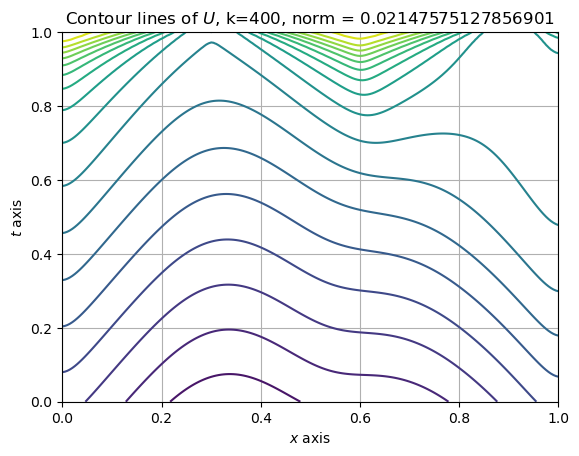

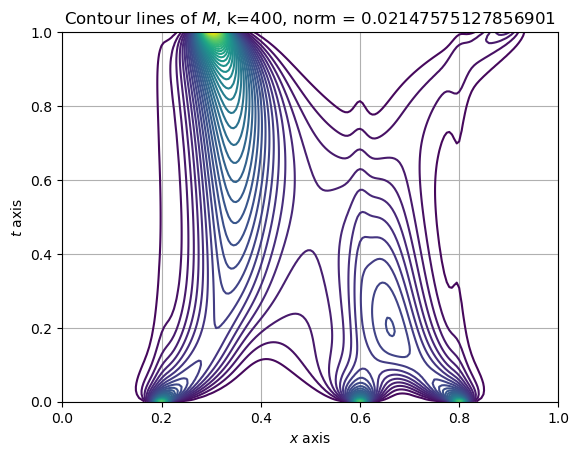

[Picard] Iteration 400, previous norm: 0.02147575127856901, theta: 0.01, elapsed time: 452.3243942260742
[Picard] Iteration 401, previous norm: 0.02125836856019365, theta: 0.01, elapsed time: 453.3859107494354
[Picard] Iteration 402, previous norm: 0.021043187773887556, theta: 0.01, elapsed time: 454.42509269714355
[Picard] Iteration 403, previous norm: 0.020830186597503443, theta: 0.01, elapsed time: 455.5304811000824
[Picard] Iteration 404, previous norm: 0.02061934293540373, theta: 0.01, elapsed time: 456.5867443084717
[Picard] Iteration 405, previous norm: 0.020410634916156356, theta: 0.01, elapsed time: 457.6498980522156
[Picard] Iteration 406, previous norm: 0.020204040890258235, theta: 0.01, elapsed time: 458.6859691143036
[Picard] Iteration 407, previous norm: 0.019999539427882157, theta: 0.01, elapsed time: 459.75389409065247
[Picard] Iteration 408, previous norm: 0.019797109316643514, theta: 0.01, elapsed time: 460.8006429672241
[Picard] Iteration 409, previous norm: 0.019596

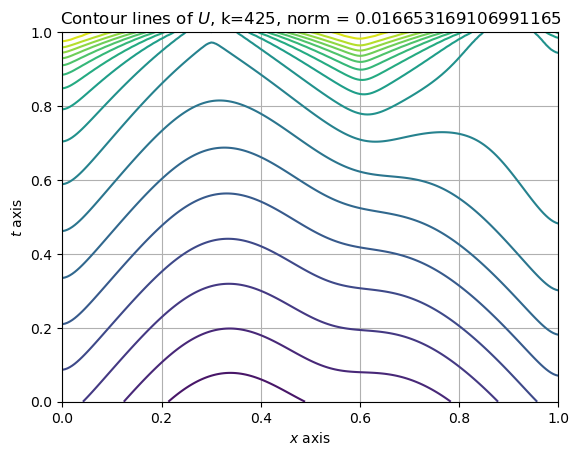

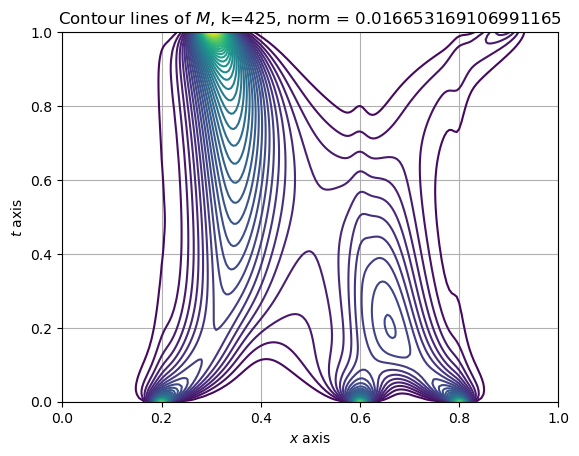

[Picard] Iteration 425, previous norm: 0.016653169106991165, theta: 0.01, elapsed time: 478.9837107658386
[Picard] Iteration 426, previous norm: 0.0164846311089546, theta: 0.01, elapsed time: 480.0138213634491
[Picard] Iteration 427, previous norm: 0.016317799933158007, theta: 0.01, elapsed time: 481.02708530426025
[Picard] Iteration 428, previous norm: 0.01615265828078702, theta: 0.01, elapsed time: 482.0710437297821
[Picard] Iteration 429, previous norm: 0.015989189028511385, theta: 0.01, elapsed time: 483.06548857688904
[Picard] Iteration 430, previous norm: 0.015827375226704406, theta: 0.01, elapsed time: 484.1212749481201
[Picard] Iteration 431, previous norm: 0.015667200097679145, theta: 0.01, elapsed time: 485.1686873435974
[Picard] Iteration 432, previous norm: 0.015508647033939811, theta: 0.01, elapsed time: 486.22443866729736
[Picard] Iteration 433, previous norm: 0.015351699596457836, theta: 0.01, elapsed time: 487.27234292030334
[Picard] Iteration 434, previous norm: 0.0151

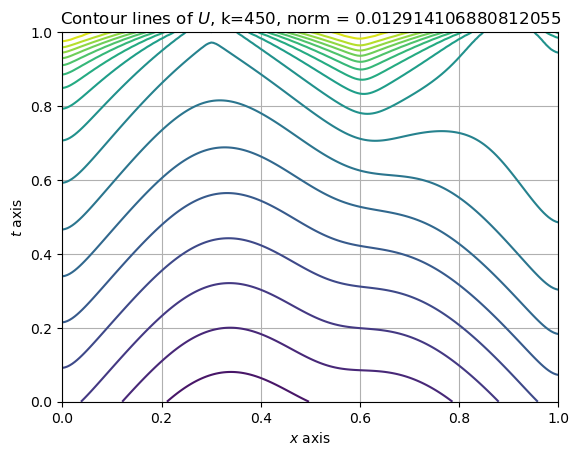

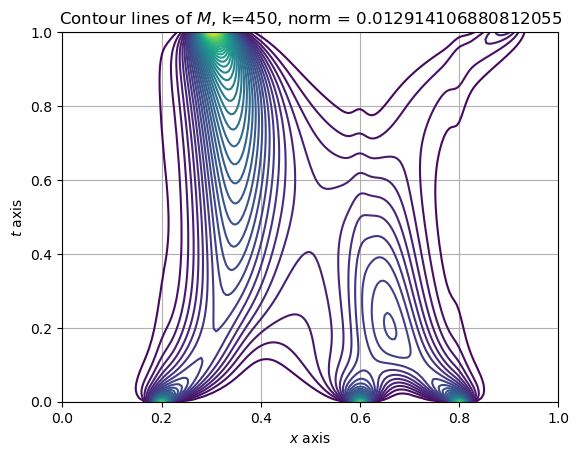

[Picard] Iteration 450, previous norm: 0.012914106880812055, theta: 0.01, elapsed time: 505.4971880912781
[Picard] Iteration 451, previous norm: 0.012783431797611123, theta: 0.01, elapsed time: 506.52050709724426
[Picard] Iteration 452, previous norm: 0.012654079832749434, theta: 0.01, elapsed time: 507.59584164619446
[Picard] Iteration 453, previous norm: 0.012526037579352053, theta: 0.01, elapsed time: 508.66287755966187
[Picard] Iteration 454, previous norm: 0.012399291766510953, theta: 0.01, elapsed time: 509.7405815124512
[Picard] Iteration 455, previous norm: 0.012273829257905051, theta: 0.01, elapsed time: 510.80187010765076
[Picard] Iteration 456, previous norm: 0.012149637050434555, theta: 0.01, elapsed time: 511.89549684524536
[Picard] Iteration 457, previous norm: 0.012026702272866936, theta: 0.01, elapsed time: 512.9588928222656
[Picard] Iteration 458, previous norm: 0.011905012184500314, theta: 0.01, elapsed time: 514.0639057159424
[Picard] Iteration 459, previous norm: 0.

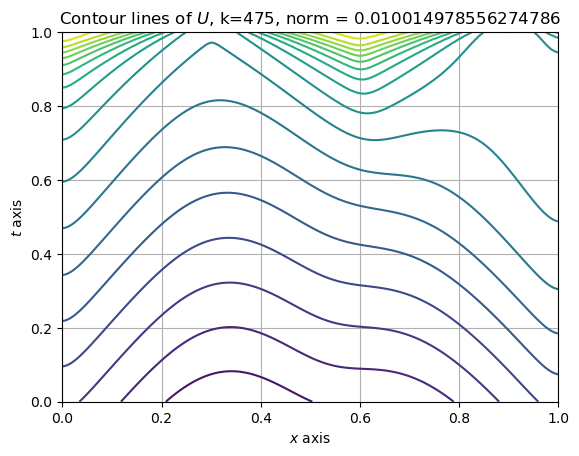

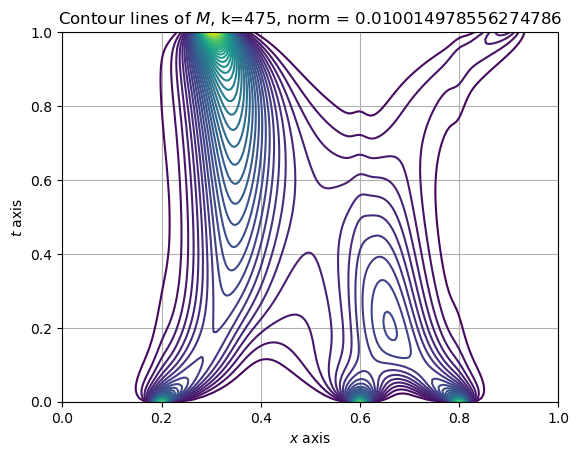

[Picard] Iteration 475, previous norm: 0.010014978556274786, theta: 0.01, elapsed time: 532.169734954834
[Picard] Iteration 476, previous norm: 0.009913655353317495, theta: 0.01, elapsed time: 533.19961977005
[Picard] Iteration 477, previous norm: 0.009813357882373691, theta: 0.01, elapsed time: 534.266135931015
[Picard] Iteration 478, previous norm: 0.009714075752185554, theta: 0.01, elapsed time: 535.3446028232574
[Picard] Iteration 479, previous norm: 0.009615798676853466, theta: 0.01, elapsed time: 536.3736574649811
[Picard] Iteration 480, previous norm: 0.00951851647476505, theta: 0.01, elapsed time: 537.4336640834808
[Picard] Iteration 481, previous norm: 0.009422219067537022, theta: 0.01, elapsed time: 538.4790697097778
[Picard] Iteration 482, previous norm: 0.009326896478968227, theta: 0.01, elapsed time: 539.4750740528107
[Picard] Iteration 483, previous norm: 0.009232538834002154, theta: 0.01, elapsed time: 540.4902939796448
[Picard] Iteration 484, previous norm: 0.0091391363

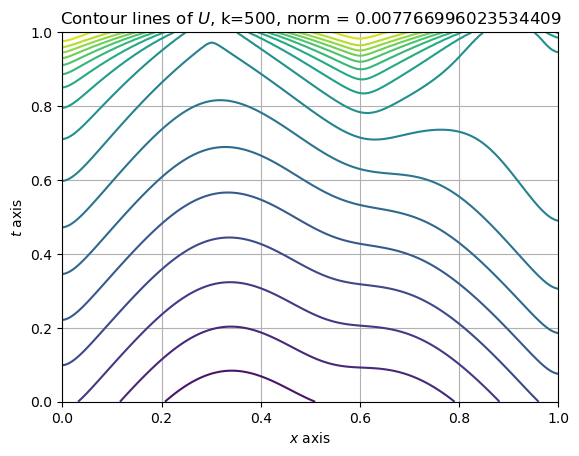

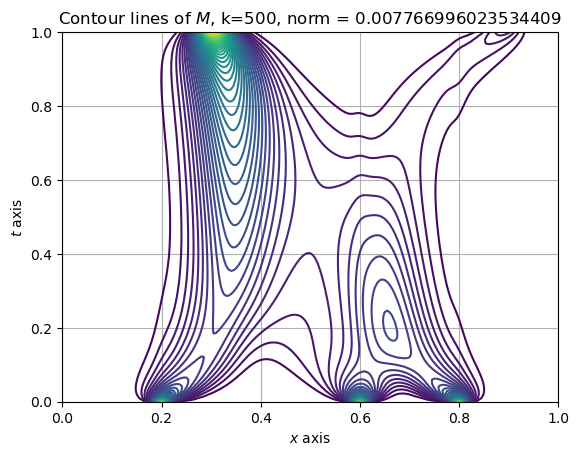

[Picard] Iteration 500, previous norm: 0.007766996023534409, theta: 0.01, elapsed time: 559.0721168518066
[Picard] Iteration 501, previous norm: 0.0076884280969490735, theta: 0.01, elapsed time: 560.1082508563995
[Picard] Iteration 502, previous norm: 0.007610655400511974, theta: 0.01, elapsed time: 561.1283655166626
[Picard] Iteration 503, previous norm: 0.007533669879761279, theta: 0.01, elapsed time: 562.174437046051
[Picard] Iteration 504, previous norm: 0.007457463561878758, theta: 0.01, elapsed time: 563.2301595211029
[Picard] Iteration 505, previous norm: 0.007382028554862722, theta: 0.01, elapsed time: 564.2536747455597
[Picard] Iteration 506, previous norm: 0.007307357046707504, theta: 0.01, elapsed time: 565.3053953647614
[Picard] Iteration 507, previous norm: 0.007233441304605902, theta: 0.01, elapsed time: 566.3625135421753
[Picard] Iteration 508, previous norm: 0.007160273674144544, theta: 0.01, elapsed time: 567.3870358467102
[Picard] Iteration 509, previous norm: 0.00708

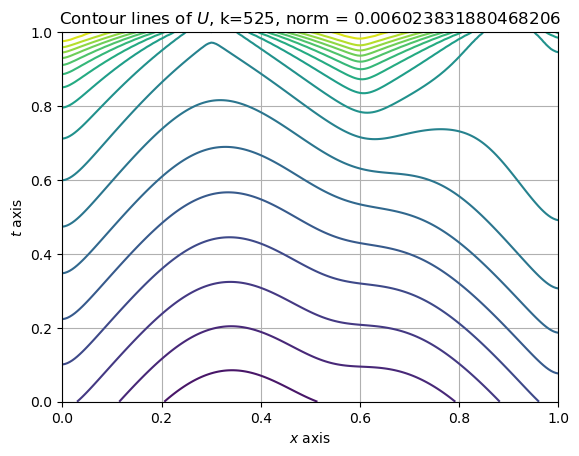

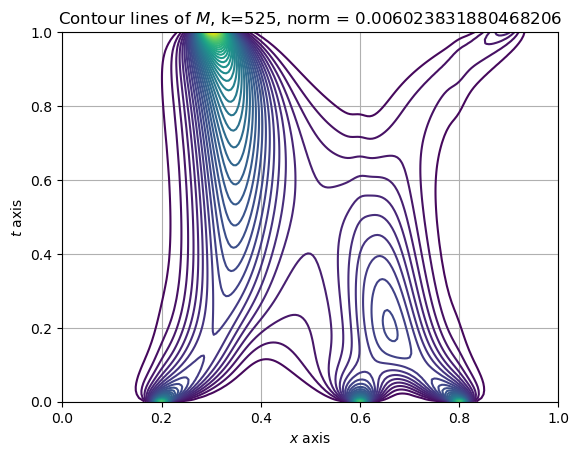

[Picard] Iteration 525, previous norm: 0.006023831880468206, theta: 0.01, elapsed time: 586.873899936676
[Picard] Iteration 526, previous norm: 0.0059629061043059255, theta: 0.01, elapsed time: 587.8782033920288
[Picard] Iteration 527, previous norm: 0.005902596886822548, theta: 0.01, elapsed time: 588.8821630477905
[Picard] Iteration 528, previous norm: 0.0058428979844672635, theta: 0.01, elapsed time: 589.885632276535
[Picard] Iteration 529, previous norm: 0.005783803216963403, theta: 0.01, elapsed time: 590.9375910758972
[Picard] Iteration 530, previous norm: 0.005725306466664947, theta: 0.01, elapsed time: 592.0287327766418
[Picard] Iteration 531, previous norm: 0.005667401677922184, theta: 0.01, elapsed time: 593.1022336483002
[Picard] Iteration 532, previous norm: 0.005610082856453069, theta: 0.01, elapsed time: 594.2155344486237
[Picard] Iteration 533, previous norm: 0.0055533440687202534, theta: 0.01, elapsed time: 595.5018444061279
[Picard] Iteration 534, previous norm: 0.0054

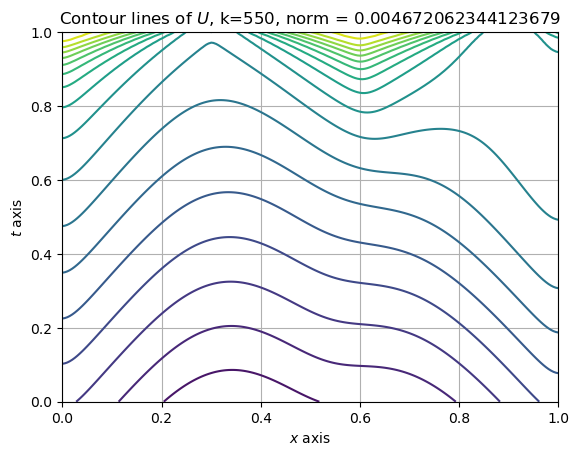

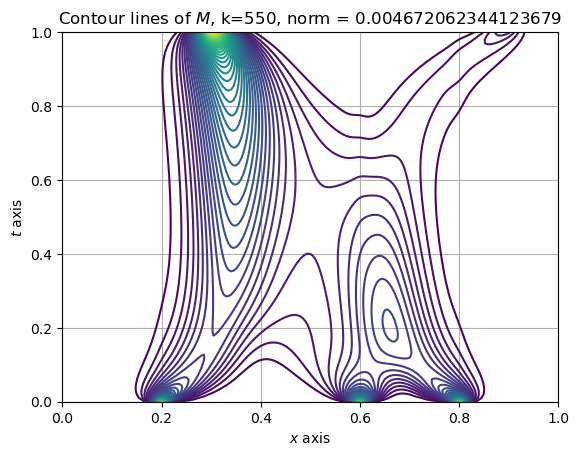

[Picard] Iteration 550, previous norm: 0.004672062344123679, theta: 0.01, elapsed time: 615.3768122196198
[Picard] Iteration 551, previous norm: 0.0046248152141982685, theta: 0.01, elapsed time: 616.3807950019836
[Picard] Iteration 552, previous norm: 0.004578046139044324, theta: 0.01, elapsed time: 617.6038115024567
[Picard] Iteration 553, previous norm: 0.004531750278587344, theta: 0.01, elapsed time: 618.8801972866058
[Picard] Iteration 554, previous norm: 0.004485922841791101, theta: 0.01, elapsed time: 620.0346932411194
[Picard] Iteration 555, previous norm: 0.004440559086162048, theta: 0.01, elapsed time: 621.2108407020569
[Picard] Iteration 556, previous norm: 0.004395654317256523, theta: 0.01, elapsed time: 622.3558430671692
[Picard] Iteration 557, previous norm: 0.0043512038881918635, theta: 0.01, elapsed time: 623.5476052761078
[Picard] Iteration 558, previous norm: 0.004307203199167236, theta: 0.01, elapsed time: 624.770605802536
[Picard] Iteration 559, previous norm: 0.0042

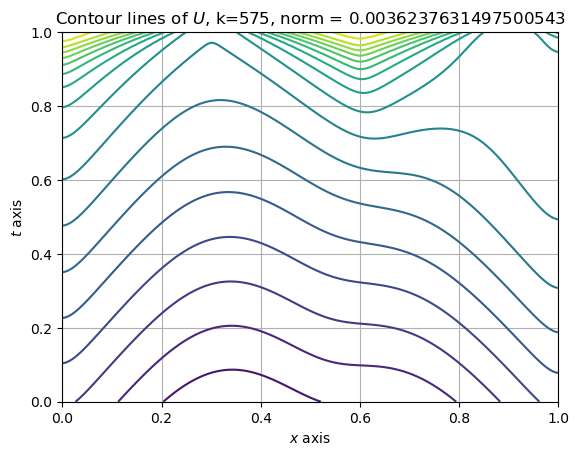

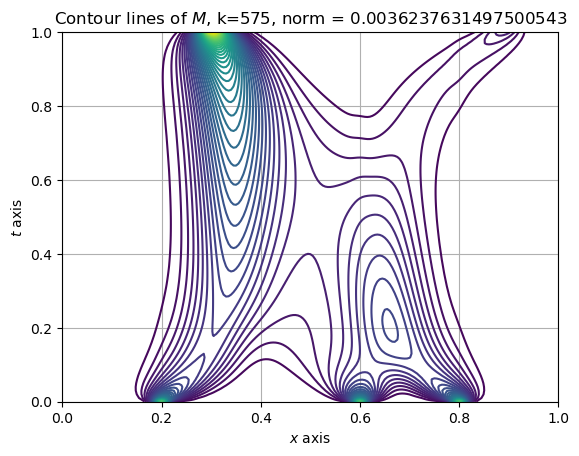

[Picard] Iteration 575, previous norm: 0.0036237631497500543, theta: 0.01, elapsed time: 645.0300357341766
[Picard] Iteration 576, previous norm: 0.003587122125414426, theta: 0.01, elapsed time: 646.0545670986176
[Picard] Iteration 577, previous norm: 0.0035508517831898487, theta: 0.01, elapsed time: 647.0900955200195
[Picard] Iteration 578, previous norm: 0.0035149483707834685, theta: 0.01, elapsed time: 648.1257266998291
[Picard] Iteration 579, previous norm: 0.0034794081739114822, theta: 0.01, elapsed time: 649.1456549167633
[Picard] Iteration 580, previous norm: 0.0034442275159142556, theta: 0.01, elapsed time: 650.1490888595581
[Picard] Iteration 581, previous norm: 0.003409402757375863, theta: 0.01, elapsed time: 651.1689088344574
[Picard] Iteration 582, previous norm: 0.0033749302957451913, theta: 0.01, elapsed time: 652.1723396778107
[Picard] Iteration 583, previous norm: 0.003340806564963101, theta: 0.01, elapsed time: 653.1763331890106
[Picard] Iteration 584, previous norm: 0

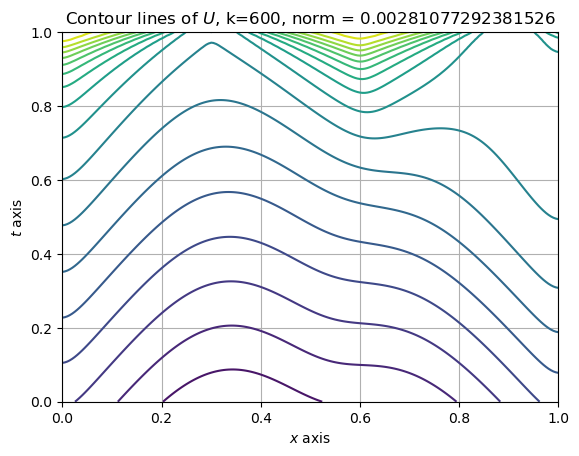

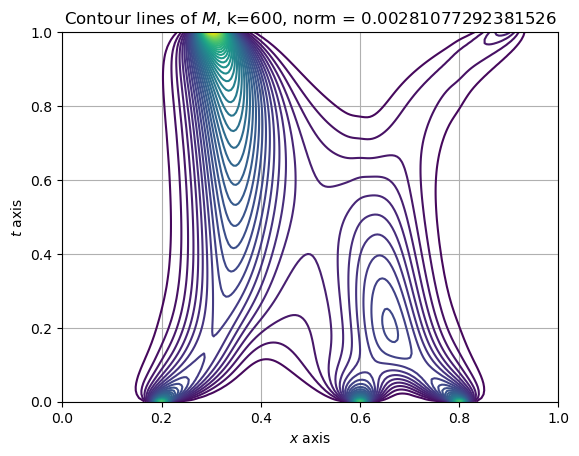

[Picard] Iteration 600, previous norm: 0.00281077292381526, theta: 0.01, elapsed time: 671.0283575057983
[Picard] Iteration 601, previous norm: 0.0027823560129790633, theta: 0.01, elapsed time: 672.0630440711975
[Picard] Iteration 602, previous norm: 0.002754226540979171, theta: 0.01, elapsed time: 673.0838253498077
[Picard] Iteration 603, previous norm: 0.002726381598675123, theta: 0.01, elapsed time: 674.0866570472717
[Picard] Iteration 604, previous norm: 0.0026988183063883877, theta: 0.01, elapsed time: 675.1062495708466
[Picard] Iteration 605, previous norm: 0.002671533813606808, theta: 0.01, elapsed time: 676.1565899848938
[Picard] Iteration 606, previous norm: 0.002644525298684103, theta: 0.01, elapsed time: 677.1453988552094
[Picard] Iteration 607, previous norm: 0.002617789968552279, theta: 0.01, elapsed time: 678.1936581134796
[Picard] Iteration 608, previous norm: 0.0025913250584287616, theta: 0.01, elapsed time: 679.2001748085022
[Picard] Iteration 609, previous norm: 0.002

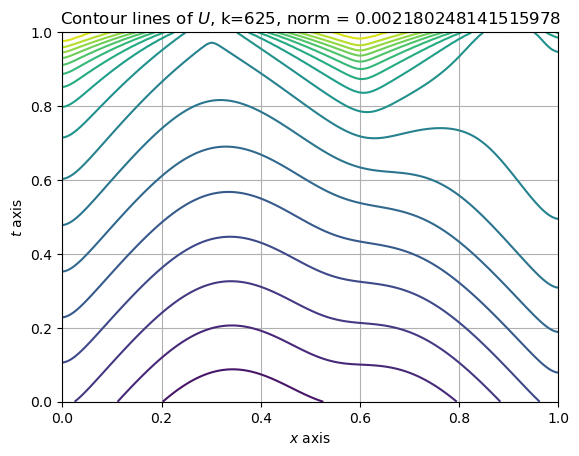

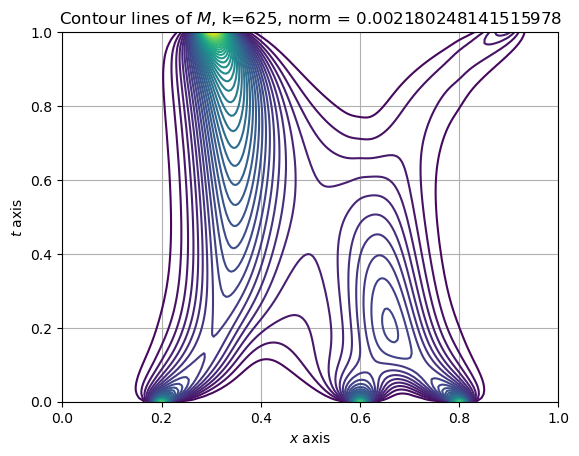

[Picard] Iteration 625, previous norm: 0.002180248141515978, theta: 0.01, elapsed time: 696.9428067207336
[Picard] Iteration 626, previous norm: 0.002158208601999508, theta: 0.01, elapsed time: 697.931134223938
[Picard] Iteration 627, previous norm: 0.0021363919615635793, theta: 0.01, elapsed time: 698.9507169723511
[Picard] Iteration 628, previous norm: 0.0021147959646460202, theta: 0.01, elapsed time: 699.9385235309601
[Picard] Iteration 629, previous norm: 0.0020934183785240863, theta: 0.01, elapsed time: 700.9424302577972
[Picard] Iteration 630, previous norm: 0.002072256993082405, theta: 0.01, elapsed time: 701.9471349716187
[Picard] Iteration 631, previous norm: 0.0020513096205846395, theta: 0.01, elapsed time: 702.9674835205078
[Picard] Iteration 632, previous norm: 0.002030574095446039, theta: 0.01, elapsed time: 703.9708938598633
[Picard] Iteration 633, previous norm: 0.0020100482740095307, theta: 0.01, elapsed time: 704.9899237155914
[Picard] Iteration 634, previous norm: 0.0

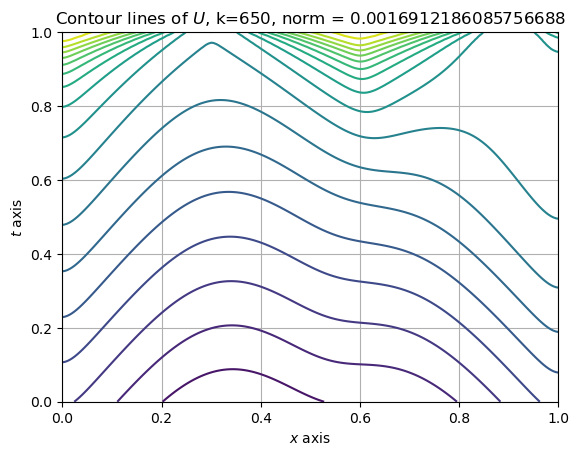

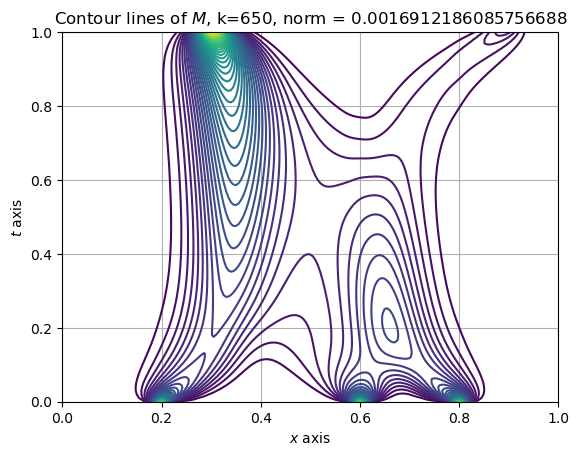

[Picard] Iteration 650, previous norm: 0.0016912186085756688, theta: 0.01, elapsed time: 722.4760849475861
[Picard] Iteration 651, previous norm: 0.001674124600436537, theta: 0.01, elapsed time: 723.4845178127289
[Picard] Iteration 652, previous norm: 0.0016572034502372844, theta: 0.01, elapsed time: 724.4575564861298
[Picard] Iteration 653, previous norm: 0.0016404534090736513, theta: 0.01, elapsed time: 725.3993842601776
[Picard] Iteration 654, previous norm: 0.001623872745746207, theta: 0.01, elapsed time: 726.4337911605835
[Picard] Iteration 655, previous norm: 0.0016074597465832578, theta: 0.01, elapsed time: 727.4693715572357
[Picard] Iteration 656, previous norm: 0.0015912127152600663, theta: 0.01, elapsed time: 728.4264390468597
[Picard] Iteration 657, previous norm: 0.0015751299726262853, theta: 0.01, elapsed time: 729.4455814361572
[Picard] Iteration 658, previous norm: 0.0015592098565291594, theta: 0.01, elapsed time: 730.4339225292206
[Picard] Iteration 659, previous norm: 

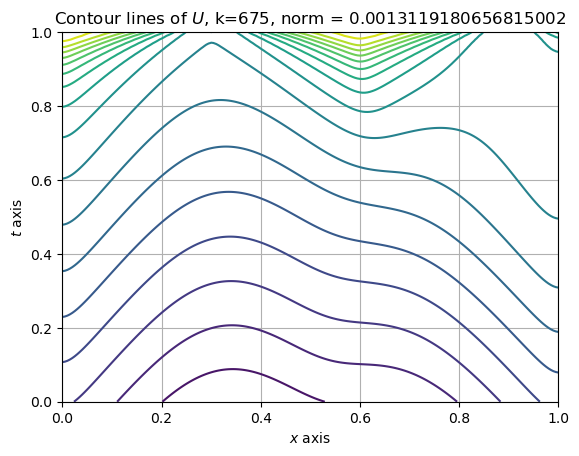

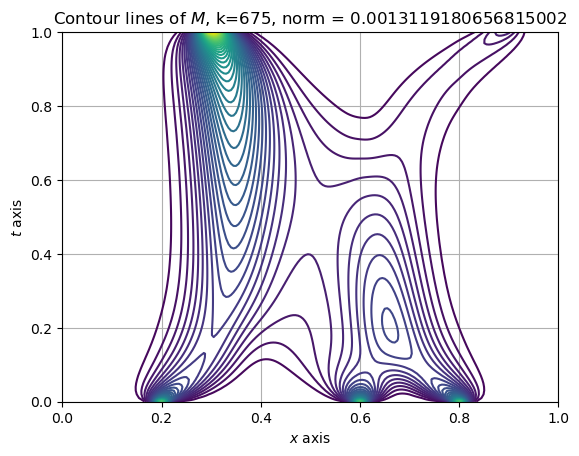

[Picard] Iteration 675, previous norm: 0.0013119180656815002, theta: 0.01, elapsed time: 748.2773954868317
[Picard] Iteration 676, previous norm: 0.0012986593818888484, theta: 0.01, elapsed time: 749.3621520996094
[Picard] Iteration 677, previous norm: 0.0012855347545927414, theta: 0.01, elapsed time: 750.4128494262695
[Picard] Iteration 678, previous norm: 0.0012725428276750864, theta: 0.01, elapsed time: 751.4750819206238
[Picard] Iteration 679, previous norm: 0.0012596822587434046, theta: 0.01, elapsed time: 752.6305100917816
[Picard] Iteration 680, previous norm: 0.0012469517189936748, theta: 0.01, elapsed time: 753.8079867362976
[Picard] Iteration 681, previous norm: 0.001234349893071526, theta: 0.01, elapsed time: 755.0131316184998
[Picard] Iteration 682, previous norm: 0.0012218754789361794, theta: 0.01, elapsed time: 756.1894841194153
[Picard] Iteration 683, previous norm: 0.0012095271877259315, theta: 0.01, elapsed time: 757.3345897197723
[Picard] Iteration 684, previous norm:

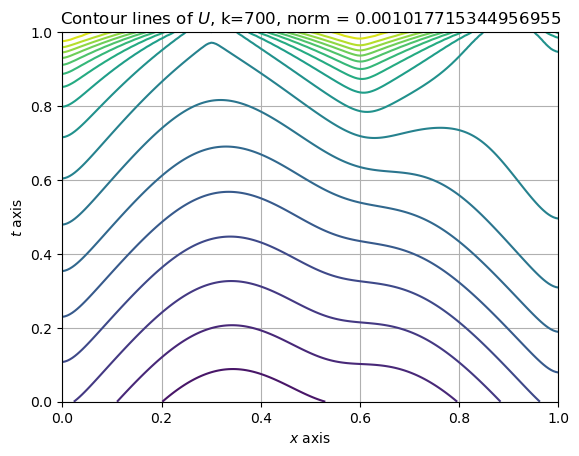

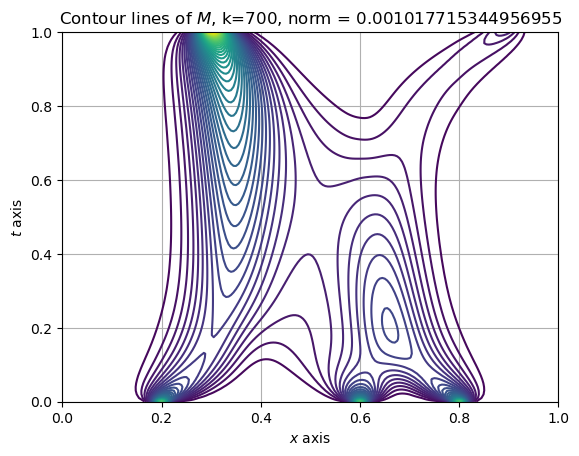

[Picard] Iteration 700, previous norm: 0.001017715344956955, theta: 0.01, elapsed time: 776.5062570571899
[Picard] Iteration 701, previous norm: 0.0010074311228729222, theta: 0.01, elapsed time: 777.5207824707031


In [8]:
################# Computing results ##################
M = np.zeros((N_T+1, N_h))
M[:] = m0_hat(space_grid)

U = np.zeros((N_T+1, N_h))
U[:] = phi(space_grid)

U_picard, M_picard = Picard(U, M)
######################################################

In [9]:
############ Saving values of U and M ################
file_name_suffix = f"beta{str(beta).replace('.', 'virgule')}_g_{g_kind}_f_{f0_tilde_kind}_phi_{phi_kind}"

with open(f'U_{file_name_suffix}.npy', 'wb') as f:
    np.save(f, U_picard)
with open(f'M_{file_name_suffix}.npy', 'wb') as f:
    np.save(f, M_picard)
######################################################

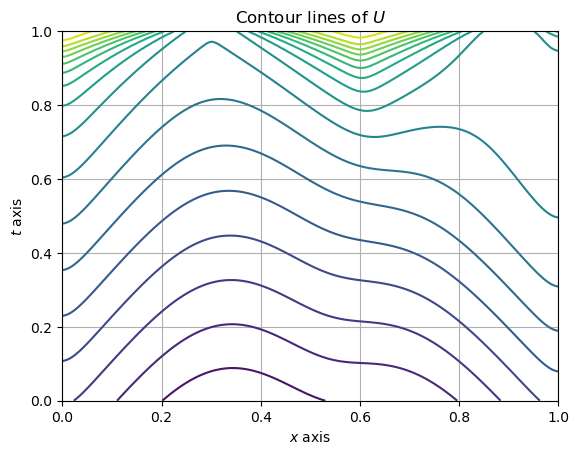

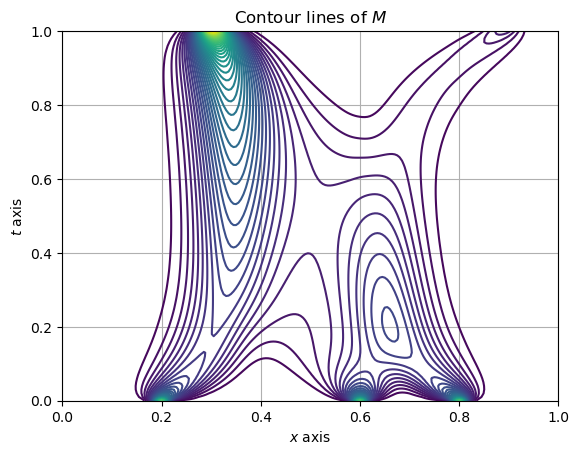

In [15]:
################# Plotting graphs ####################
plt.contour(space_grid, time_grid, U_picard, levels=20)
plt.title("Contour lines of $U$")
plt.xlabel("$x$ axis")
plt.ylabel("$t$ axis")
plt.grid()
plt.show()

plt.contour(space_grid, time_grid, M_picard, levels=50)
plt.grid()
plt.title("Contour lines of $M$")
plt.xlabel("$x$ axis")
plt.ylabel("$t$ axis")
plt.show()
######################################################

MovieWriter ffmpeg unavailable; using Pillow instead.


ValueError: unknown file extension: .mp4

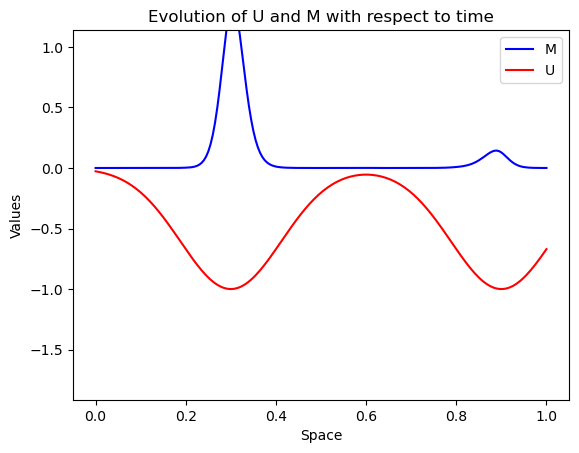

In [12]:
################# Plotting videos ####################
fig, ax = plt.subplots()

line1, = ax.plot(space_grid, M_picard[0, :], color='blue', label='M')
line2, = ax.plot(space_grid, U_picard[0, :], color='red', label='U')

ax.legend(loc='best')
ax.set_title('Evolution of U and M with respect to time')
ax.set_xlabel('Space')
ax.set_ylabel('Values')

def init():
    line1.set_ydata([np.nan] * len(space_grid))
    line2.set_ydata([np.nan] * len(space_grid))
    return line1, line2

def animate(i):
    line1.set_ydata(M_picard[i, :])  # mise à jour des données de la ligne 1
    line2.set_ydata(U_picard[i, :])  # mise à jour des données de la ligne 2
    return line1, line2

# Create animation
ani = animation.FuncAnimation(
    fig, animate, init_func=init, interval=100, blit=True, frames=len(time_grid)
)
ani.save('video_mfg.mp4', writer='ffmpeg')

# Display animation
HTML(ani.to_jshtml())
######################################################